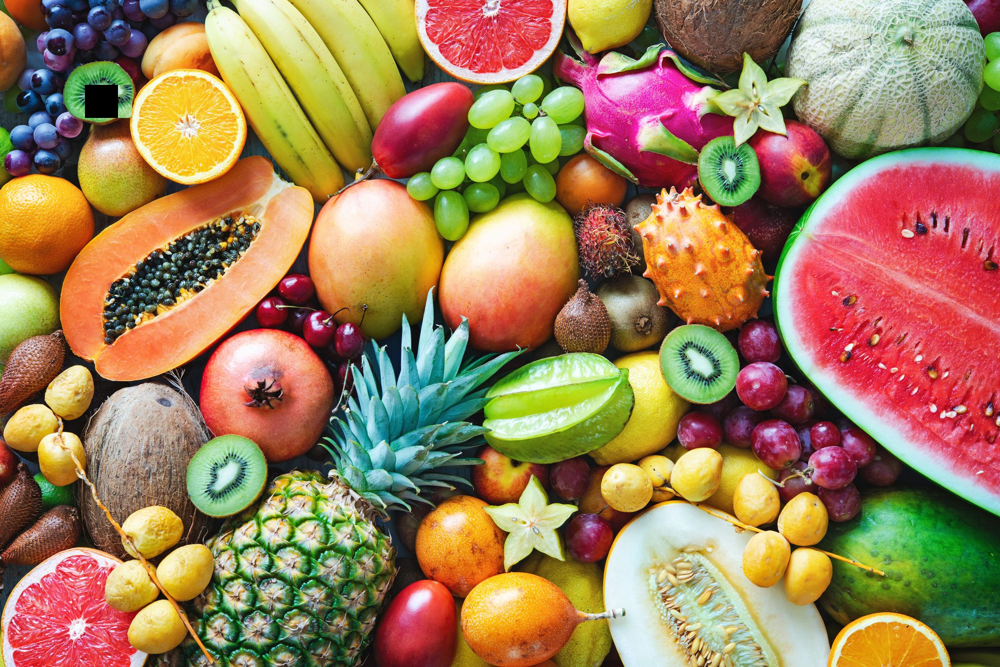

In [10]:
import cv2
from google.colab.patches import cv2_imshow

# Đọc ảnh đúng đường dẫn
img = cv2.imread("colorful-ripe-tropical-fruits.jpg")

# Kiểm tra ảnh có đọc được không
if img is None:
    raise FileNotFoundError("Không tìm thấy ảnh. Kiểm tra lại đường dẫn.")

# Sao chép ảnh
img_copy = img.copy()

# Tọa độ tương đối của quả kiwi (kiwi phía trái)
kiwi_x, kiwi_y, kiwi_w, kiwi_h = 180, 180, 70, 70
kiwi_roi = img[kiwi_y:kiwi_y+kiwi_h, kiwi_x:kiwi_x+kiwi_w]

# Dịch kiwi sang phải 30 pixels
img_copy[kiwi_y:kiwi_y+kiwi_h, kiwi_x+30:kiwi_x+30+kiwi_w] = kiwi_roi

# Tô đen vị trí kiwi cũ
img_copy[kiwi_y:kiwi_y+kiwi_h, kiwi_x:kiwi_x+kiwi_w] = (0, 0, 0)

# Hiển thị kết quả
cv2_imshow(img_copy)


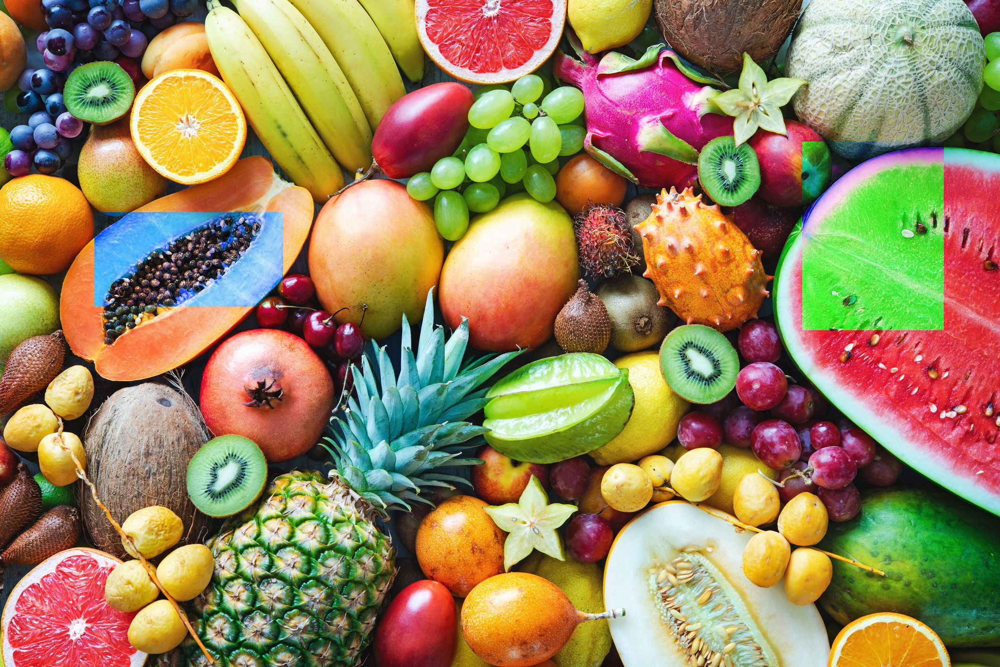

In [26]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# Đọc ảnh
img = cv2.imread("colorful-ripe-tropical-fruits.jpg")

# Kiểm tra ảnh
if img is None:
  raise FileNotFoundError("Không tìm thấy ảnh. Kiểm tra lại đường dẫn.")

img_copy = img.copy()

# ---- Đổi màu quả ĐU ĐỦ ----
# Vị trí tương đối quả đu đủ (bên trái ảnh)
papaya = img_copy[450:650, 200:600]
papaya_hsv = cv2.cvtColor(papaya, cv2.COLOR_BGR2HSV)
papaya_hsv[..., 0] = (papaya_hsv[..., 0] + 90) % 180  # đổi màu Hue
papaya_colored = cv2.cvtColor(papaya_hsv, cv2.COLOR_HSV2BGR)
img_copy[450:650, 200:600] = papaya_colored

# ---- Đổi màu quả DƯA HẤU ----
# Vị trí tương đối dưa hấu (bên phải ảnh)
watermelon = img_copy[300:700, 1700:2000]
watermelon_hsv = cv2.cvtColor(watermelon, cv2.COLOR_BGR2HSV)
watermelon_hsv[..., 0] = (watermelon_hsv[..., 0] + 60) % 180
watermelon_colored = cv2.cvtColor(watermelon_hsv, cv2.COLOR_HSV2BGR)
img_copy[300:700, 1700:2000] = watermelon_colored

# Hiển thị kết quả
cv2_imshow(img_copy)

In [28]:
import cv2
import numpy as np
import os

# Đường dẫn ảnh
img_path = os.path.join("quang_ninh.jpg")
img = cv2.imread(img_path)

# Giả sử đã xác định được vùng chứa núi và thuyền
# Ta dùng tọa độ x, y, w, h để cắt các vùng đó. Đây là ví dụ minh họa:
mountain_roi = img[100:400, 100:400]  # (y1:y2, x1:x2) cho vùng núi
boat_roi = img[450:600, 300:500]      # vùng thuyền

def rotate_image(image, angle):
    # Xoay ảnh quanh tâm
    (h, w) = image.shape[:2]
    center = (w // 2, h // 2)
    matrix = cv2.getRotationMatrix2D(center, angle, 1.0)
    rotated = cv2.warpAffine(image, matrix, (w, h), borderMode=cv2.BORDER_REFLECT)
    return rotated

# Xoay núi và thuyền 45 độ
rotated_mountain = rotate_image(mountain_roi, 45)
rotated_boat = rotate_image(boat_roi, 45)

# Lưu kết quả
cv2.imwrite("rotated_mountain.jpg", rotated_mountain)
cv2.imwrite("rotated_boat.jpg", rotated_boat)
print("Đã lưu các ảnh xoay thành công!")

Đã lưu các ảnh xoay thành công!


In [ ]:
import cv2
import numpy as np

# Danh sách 3 ảnh có sẵn trong thư mục "exercise"
image_files = {
    '1': 'colorful-ripe-tropical-fruits.jpg',
    '2': 'ha-long-bay-in-vietnam.jpg',
    '3': 'pagoda.jpg',
    '4': 'quang_ninh.jpg'
}

# Hỏi người dùng chọn hình
def choose_image():
    print("Chọn ảnh:")
    print("1 - colorful-ripe-tropical-fruits.jpg")
    print("2 - ha-long-bay-in-vietnam.jpg")
    print("3 - pagoda.jpg")
    print("4 - quang_ninh.jpg")
    choice = input("Nhập số ảnh (1, 2, 3, 4): ")
    path = image_files.get(choice)
    if not path:
        print("Lựa chọn không hợp lệ.")
        return None
    img = cv2.imread(path)
    if img is None:
        print("Không đọc được ảnh.")
    return img

# Tịnh tiến ảnh
def translate_image(img, tx=50, ty=50):
    h, w = img.shape[:2]
    M = np.float32([[1, 0, tx], [0, 1, ty]])
    return cv2.warpAffine(img, M, (w, h))

# Xoay ảnh
def rotate_image(img, angle=45):
    h, w = img.shape[:2]
    center = (w // 2, h // 2)
    M = cv2.getRotationMatrix2D(center, angle, 1.0)
    return cv2.warpAffine(img, M, (w, h))

# Phóng to ảnh
def scale_up(img, factor=1.5):
    return cv2.resize(img, None, fx=factor, fy=factor, interpolation=cv2.INTER_LINEAR)

# Thu nhỏ ảnh
def scale_down(img, factor=0.5):
    return cv2.resize(img, None, fx=factor, fy=factor, interpolation=cv2.INTER_AREA)

# Hiển thị tọa độ pixel
def coordinate_map(img):
    clone = img.copy()
    def click_event(event, x, y, flags, param):
        if event == cv2.EVENT_LBUTTONDOWN:
            print(f"Toạ độ: ({x}, {y}), Màu BGR: {img[y, x]}")
            cv2.circle(clone, (x, y), 5, (0, 0, 255), -1)
            cv2.imshow("Coordinate Map", clone)

    cv2.imshow("Coordinate Map", clone)
    cv2.setMouseCallback("Coordinate Map", click_event)
    cv2.waitKey(0)
    cv2.destroyAllWindows()

# Menu chính
def main():
    print("MENU:")
    print("T - Tịnh tiến")
    print("X - Xoay")
    print("P - Phóng to")
    print("H - Thu nhỏ")
    print("C - Coordinate Map")

    key = input("Nhập lựa chọn: ").upper()

    img = choose_image()
    if img is None:
        return

    if key == 'T':
        result = translate_image(img, 50, 50)
        cv2.imshow("Tịnh tiến", result)
    elif key == 'X':
        result = rotate_image(img, 45)
        cv2.imshow("Xoay", result)
    elif key == 'P':
        result = scale_up(img)
        cv2.imshow("Phóng to", result)
    elif key == 'H':
        result = scale_down(img)
        cv2.imshow("Thu nhỏ", result)
    elif key == 'C':
        coordinate_map(img)
        return
    else:
        print("Lựa chọn không hợp lệ.")
        return

    cv2.waitKey(0)
    cv2.destroyAllWindows()

# Chạy chương trình
main()


In [30]:
import cv2

# Đọc ảnh gốc từ thư mục exercise
img = cv2.imread("pagoda.jpg")

# Kiểm tra ảnh
if img is None:
    raise FileNotFoundError("Không tìm thấy ảnh pagoda.jpg. Kiểm tra lại đường dẫn.")

#  Chọn vùng ngôi chùa (tọa độ cần điều chỉnh theo ảnh thật)
x, y, w, h = 150, 80, 200, 250
pagoda_roi = img[y:y+h, x:x+w]

#  Phóng to vùng chùa lên 5 lần
pagoda_large = cv2.resize(pagoda_roi, None, fx=5.0, fy=5.0, interpolation=cv2.INTER_CUBIC)

# Lưu ảnh kết quả
cv2.imwrite("pagoda_zoomed.jpg", pagoda_large)
print("Đã lưu ảnh phóng to vào: pagoda_zoomed.jpg")


Đã lưu ảnh phóng to vào: pagoda_zoomed.jpg
